![banner cnns ppgcc ufsc](http://www.lapix.ufsc.br/wp-content/uploads/2019/04/VC2.png)


# Deep Learning Model for the Visual Aesthetic Evaluation of User Interfaces in Mobile Applications for Android Devices


Notebook for the evaluation of the visual aesthetic of user interfaces of mobile Android applications. This notebook assumes that you are either using Google Colab or that you have the latest versions of PyTorch and fast.ai installed.


##Part 1 - Initializations 

In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

###Testing if your Jupyter Notebook is in fact running with a GPU...

As suggested by Hiromi Suenaga:
https://medium.com/@hiromi_suenaga/deep-learning-2-part-1-lesson-1-602f73869197

You should get '**/device:GPU:0**' if notebook is connected to GPU otherwise you'll see ''

In [0]:
import sys
sys.version

import tensorflow as tf
tf.test.gpu_device_name()

###Testing your virtual machine on Google Colab...

If you had issues: look at the driver version, which board and which version of CUDA are available...

In [0]:
!/opt/bin/nvidia-smi
!nvcc --version

Thu Nov 21 18:36:47 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.67       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    35W / 250W |    265MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

If you've had problems, look at the OS version...

In [0]:
!uname -a
!cat /etc/lsb-release

Linux cb74ee1e2a05 4.14.137+ #1 SMP Thu Aug 8 02:47:02 PDT 2019 x86_64 x86_64 x86_64 GNU/Linux
DISTRIB_ID=Ubuntu
DISTRIB_RELEASE=18.04
DISTRIB_CODENAME=bionic
DISTRIB_DESCRIPTION="Ubuntu 18.04.3 LTS"


###Option to mount your Google Drive as a virtual disk

Note that to make this work you must have the data *in the same Drive account running this notebook*.
Modify the code below as needed to represent the actual structure of your own Google Drive. The only common path for everyone will be '**/content/drive/** which is where Collab mounts the root path for the virtual disk.

In [0]:
import os

# To mount the Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

#### Checks...

...list the Drive content to check if its working as intended...

In [0]:
!ls "/content/gdrive/My Drive"

...if everything is working as intended you should've seen your data under **/content/gdrive/My Drive/**

###Library imports

Here we import all the necessary packages. We are going to work with the [fastai V1 library](http://www.fast.ai/2018/10/02/fastai-ai/) which sits on top of [Pytorch 1.0](https://hackernoon.com/pytorch-1-0-468332ba5163). The fastai library provides many useful functions that enable us to quickly and easily build neural networks and train our models.

In [0]:
from fastai.vision import *
from fastai.metrics import error_rate
from fastai.callbacks import SaveModelCallback

# Import for various utilities
from shutil import copyfile
import matplotlib.pyplot as plt
import operator
from PIL import Image
from sys import intern   # For the symbol definitions

### Looking at the data

We are going to use the Mobile Interfaces  Data collected at GQS/UFSC...

...create an instance of PosixPath...

In [0]:
path = Path("/content/gdrive/My Drive/University/TCC/data_iter3");
path
path.ls()

[PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/labels.csv'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/old_bland-altman'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/bland_altman_with_neg.csv'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/bland_altman.csv'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/export.pkl'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/models')]

...now list the data in the train folder to see if its all in order...

In [0]:
train_path = path/'train'
train_path
train_path.ls()

[PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3966_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3963_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3962_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3964_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3965_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3967_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3968_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3969_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3971_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3972_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/data_iter3/train/3985_rico.jpg'),
 PosixPath('/content/gdrive/My Drive/University/TCC/da

###Generating the databunch to train and test the network

We create an ImageList from the **.csv file**, containing the scores, and the **train** folder and later transform it into a **databunch**.

**split_from_df()** used to create a test set with a set part of the train set, identified by the column 'valid' in the .csv file.

**label_from_df=FloatList** tells fastai we want to work with a *regression* model.

We leave data augmentation as is by not passing any parameters to **get_transforms()**, since they do not serve any purpose in our analysis.

**databunch()** then transforms the resulting ImageList into an actual databunch we can work with.


In [0]:
# Making our 'default' transformation
tfms = get_transforms(do_flip=False, flip_vert=False, max_rotate=None, 
                      max_warp=None, max_lighting=None, max_zoom=1.0)
# Show how many transformations were created
print('Transforms = ', len(tfms))

# Create the databunch with transformations (tfms) and size (size)
data = (ImageList.from_csv(path, 'labels.csv', folder='train', suffix='.jpg')
        .split_from_df(col='valid')
        .label_from_df(label_cls=FloatList)
        .transform(tfms, size=448)
        .databunch()
       )

# Considering GPU memory capacity, we adjust batch_size as needed...
# If using ResNet34 or lower:
# data.batch_size = 64

# If using ResNet50:
# data.batch_size = 32

# If using ResNet101:
data.batch_size = 16

# Show what was created...
data

Transforms =  2


ImageDataBunch;

Train: LabelList (2509 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.17,0.0,0.0,0.0,0.0
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Valid: LabelList (630 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.5,0.0,0.33,0.67,0.67
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Test: None

#### Looking at what we created...

In [0]:
def plots_f(rows, cols, width, height, **kwargs):
    [get_ex().apply_tfms(tfms[0], **kwargs).show(ax=ax) for i,ax in enumerate(plt.subplots(
        rows,cols,figsize=(width,height))[1].flatten())]

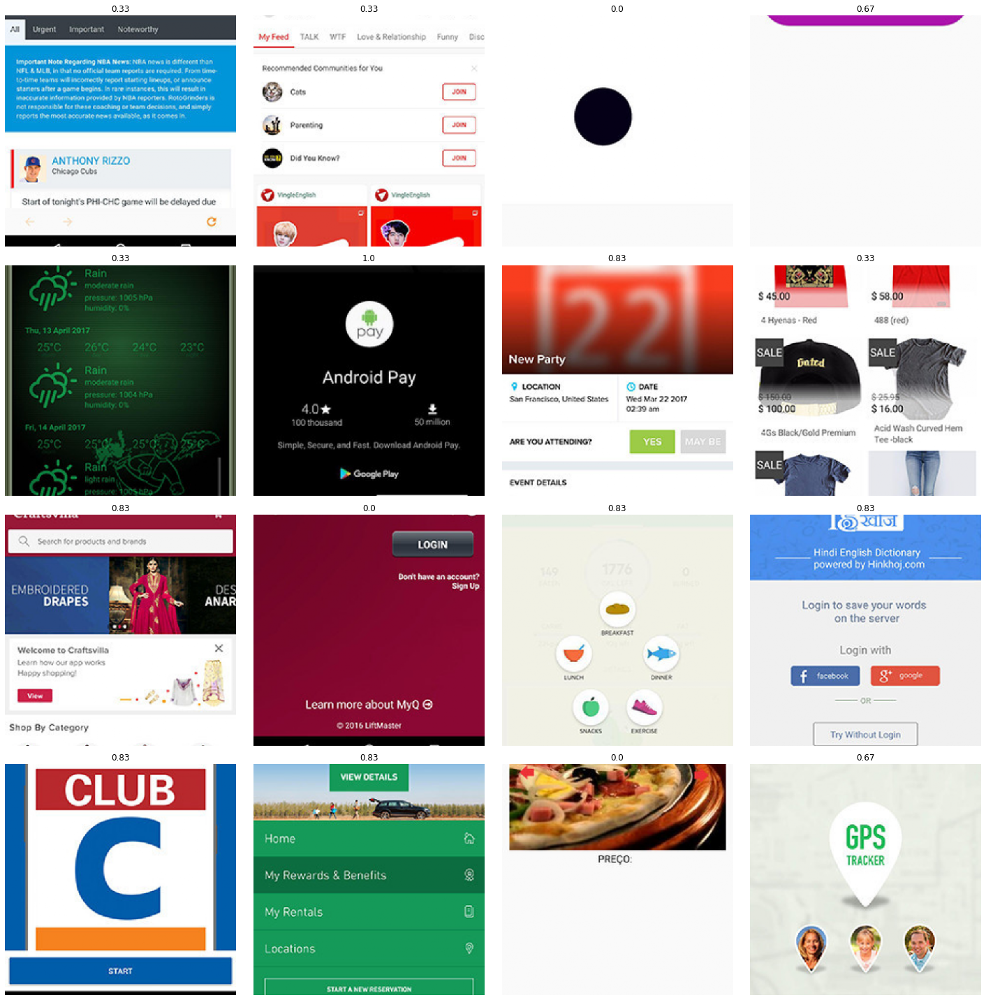

In [0]:
data.show_batch(rows=4, figsize=(20,20))

# Part 2 - Training our model

Now we will start training our model. We will use a [convolutional neural network](http://cs231n.github.io/convolutional-networks/) backbone and a fully connected head with a single hidden layer as a classifier. Don't know what these things mean? Not to worry, we will dive deeper in the coming lessons. For the moment you need to know that we are building a model which will take images as input and will output the predicted probability for each of the categories (in this case, it will have 37 outputs).


### Training strategy
- We will train the model using two approaches:

  - We will first attempt a more manual approach, using the *fit* method call to train the model and see how it performs.

  - For our second approach we will employ the  *fit1cycle* method developed by  Leslie N. Smith  - see below for details: 

    - https://docs.fast.ai/callbacks.one_cycle.html

    - A disciplined approach to neural network hyper-parameters: Part 1 -- learning rate, batch size, momentum, and weight decay - https://arxiv.org/abs/1803.09820
    
    - Super-Convergence: Very Fast Training of Residual Networks Using Large Learning Rates - https://arxiv.org/abs/1708.07120

Since the *fit1cycle* method is fast, we will employ only 10 epochs in the first Transfer Learning stage.

We will also save the networks in both approaches each epoch, if the performance gets better: https://docs.fast.ai/callbacks.html#SaveModelCallback


## Training the ResNet34

In [0]:
learn = cnn_learner(data, models.resnet34, metrics=[mean_squared_error])
learn.loss = MSELossFlat

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:03<00:00, 27.7MB/s]


Show the architecture...

In [0]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

### First approach: *fit*

In [0]:
learn.fit(15, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model34-fit-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,2.665278,0.388290,0.388290,16:01
1,1.175129,0.133210,0.133210,01:21
2,0.592302,0.112362,0.112362,01:20
3,0.330936,0.088863,0.088863,01:20
4,0.209174,0.103116,0.103116,01:19
5,0.152472,0.092598,0.092598,01:19
6,0.128095,0.090300,0.090300,01:20
7,0.117212,0.092185,0.092185,01:21
8,0.112407,0.093595,0.093595,01:20
9,0.111975,0.101622,0.101622,01:20


### Second approach: *fit1cycle*

In [0]:
learn.fit_one_cycle(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model34-1cycle-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,1.346200,0.345817,0.345817,00:55
1,0.964238,0.287325,0.287325,00:55
2,0.653745,0.138574,0.138574,00:55
3,0.406623,0.097395,0.097395,00:55
4,0.258767,0.084015,0.084015,00:55
5,0.178251,0.079108,0.079108,00:55
6,0.132694,0.079129,0.079129,00:55
7,0.107215,0.077635,0.077635,00:55
8,0.093777,0.076452,0.076452,00:55
9,0.088713,0.076611,0.076611,00:55


...fine-tunings...

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 7.59E-07
Min loss divided by 10: 9.12E-08


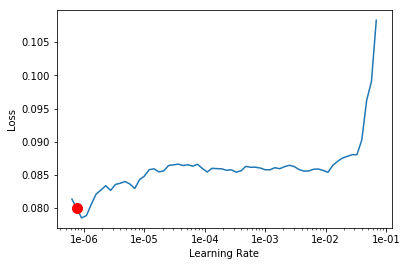

In [0]:
learn = cnn_learner(data, models.resnet34, metrics=[mean_squared_error])
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model34-1cycle-best')
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [0]:
learn = cnn_learner(data, models.resnet34, metrics=[mean_squared_error])
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model34-1cycle-best')
learn.unfreeze()

In [0]:
learn.fit_one_cycle(15, max_lr=slice(6e-07, 9e-07),callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model34-1cycle-2ndStage-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.083276,0.066707,0.066707,01:02
1,0.079654,0.066410,0.066410,01:02
2,0.080907,0.065933,0.065933,01:02
3,0.084563,0.066232,0.066232,01:01
4,0.085267,0.065981,0.065981,01:00
5,0.083878,0.065629,0.065629,01:00
6,0.082514,0.065603,0.065603,01:00
7,0.082891,0.065101,0.065101,00:59
8,0.082275,0.065344,0.065344,01:00
9,0.081170,0.065458,0.065458,00:59


## Results ResNet34

Let's see what results we have got. 

We will print examples to see how well the model performed at predicting the aesthetic value of our images against the ground truth value assigned to them.

#### fit

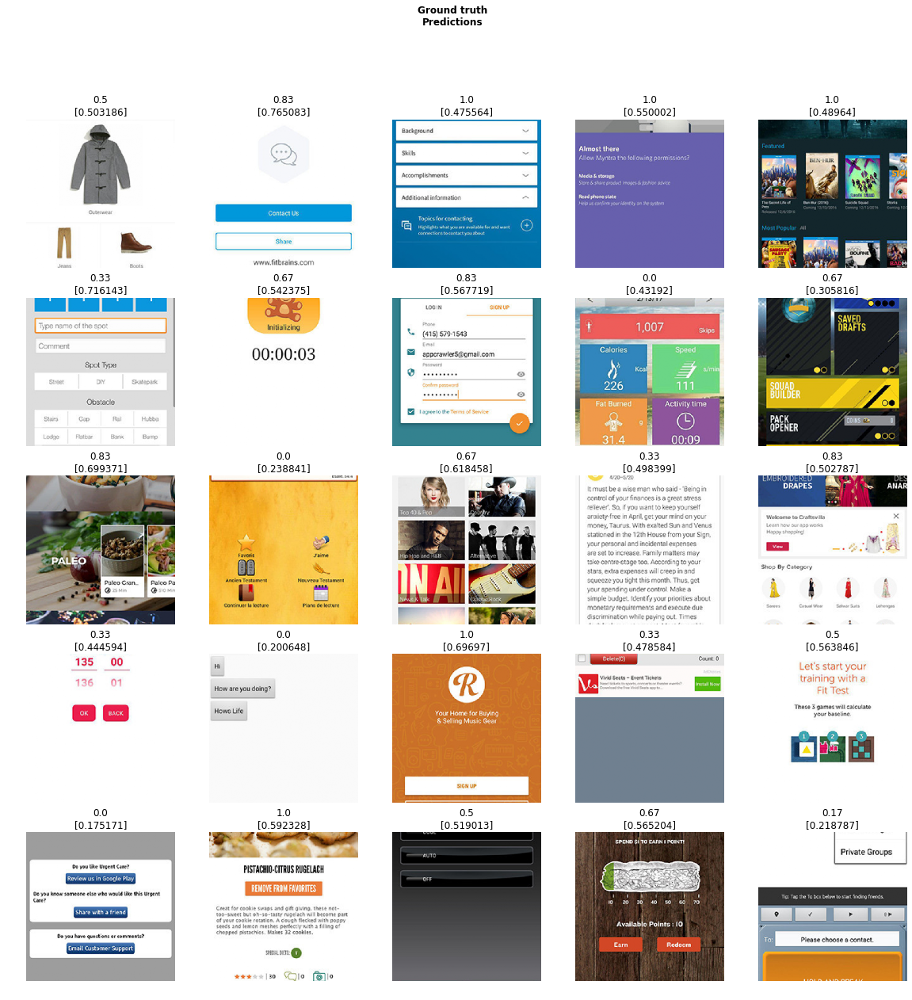

In [0]:
learn.show_results()

#### fit1cycle

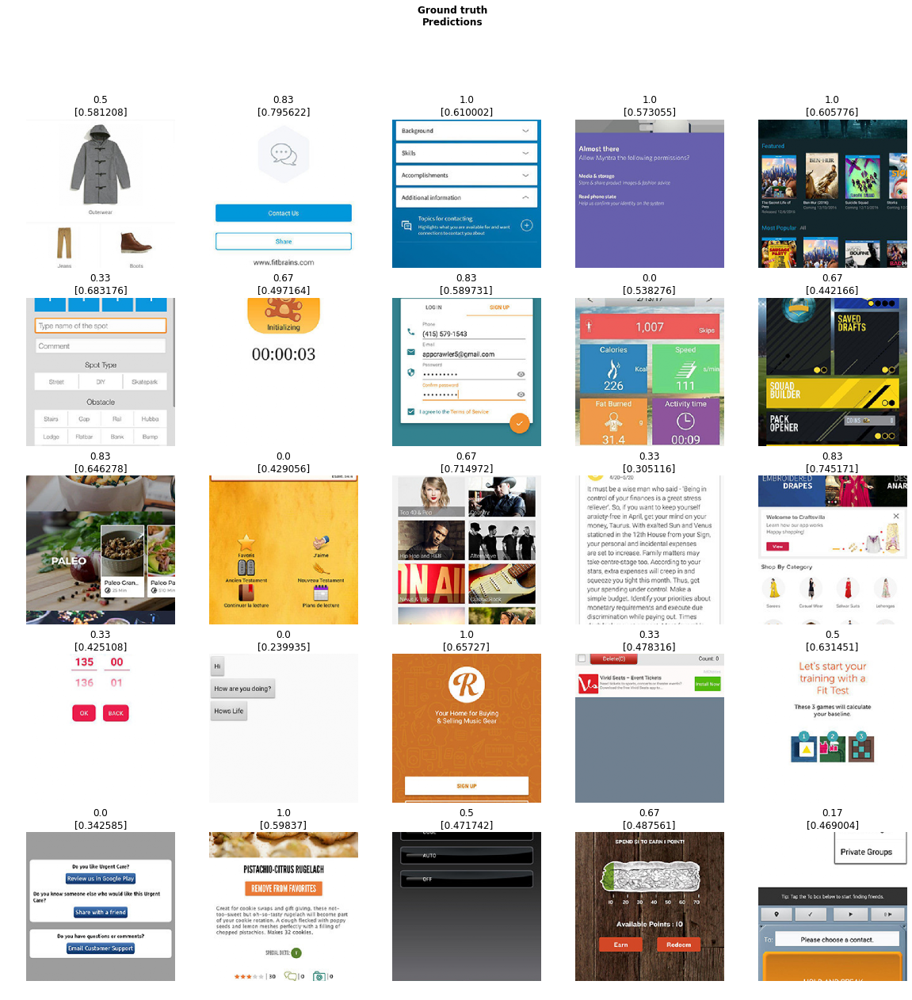

In [0]:
learn.show_results()

#Part 3 - Using less powerful models...

## Training the ResNet18

In [0]:
learn = cnn_learner(data, models.resnet18, metrics=mean_squared_error)
learn.loss = MSELossFlat

In [0]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (rel

### First approach: *fit*

In [0]:
learn.fit(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model18-fit-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.893219,0.189643,0.189643,00:54
1,0.445039,0.097660,0.097660,00:54
2,0.262859,0.084311,0.084311,00:54
3,0.178290,0.081475,0.081475,00:54
4,0.134558,0.080374,0.080374,00:54
5,0.113917,0.079719,0.079719,00:54
6,0.102972,0.078926,0.078926,00:54
7,0.097902,0.079204,0.079204,00:54
8,0.093224,0.085368,0.085368,00:54
9,0.091868,0.082390,0.082390,00:54


### Second approach: *fit1cycle*

In [0]:
learn.fit_one_cycle(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model18-1cycle-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,1.439899,0.342722,0.342722,00:55
1,1.048183,0.295859,0.295859,00:56
2,0.725826,0.157778,0.157778,00:56
3,0.448411,0.096934,0.096934,00:55
4,0.280317,0.086865,0.086865,00:55
5,0.189216,0.083267,0.083267,00:55
6,0.140565,0.081025,0.081025,00:55
7,0.114164,0.078895,0.078895,00:55
8,0.099188,0.077553,0.077553,00:55
9,0.090575,0.077254,0.077254,00:55


...fine-tunings....

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 9.12E-07
Min loss divided by 10: 1.91E-05


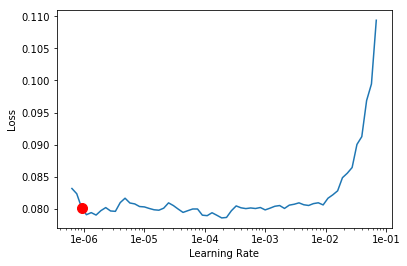

In [0]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model18-1cycle-best')
learn.unfreeze()
learn.fit_one_cycle(15, max_lr=slice(6e-07, 1e-06),callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model18-1cycle-2ndStage-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.079206,0.077110,0.077110,00:57
1,0.081327,0.077324,0.077324,01:00
2,0.081340,0.077000,0.077000,00:58
3,0.082313,0.076864,0.076864,00:57
4,0.083625,0.076748,0.076748,00:57
5,0.081753,0.076317,0.076317,00:56
6,0.082399,0.076546,0.076546,00:56
7,0.082884,0.076277,0.076277,00:55
8,0.082499,0.076368,0.076368,00:55
9,0.084261,0.076438,0.076438,00:54


## Results ResNet18

#### fit

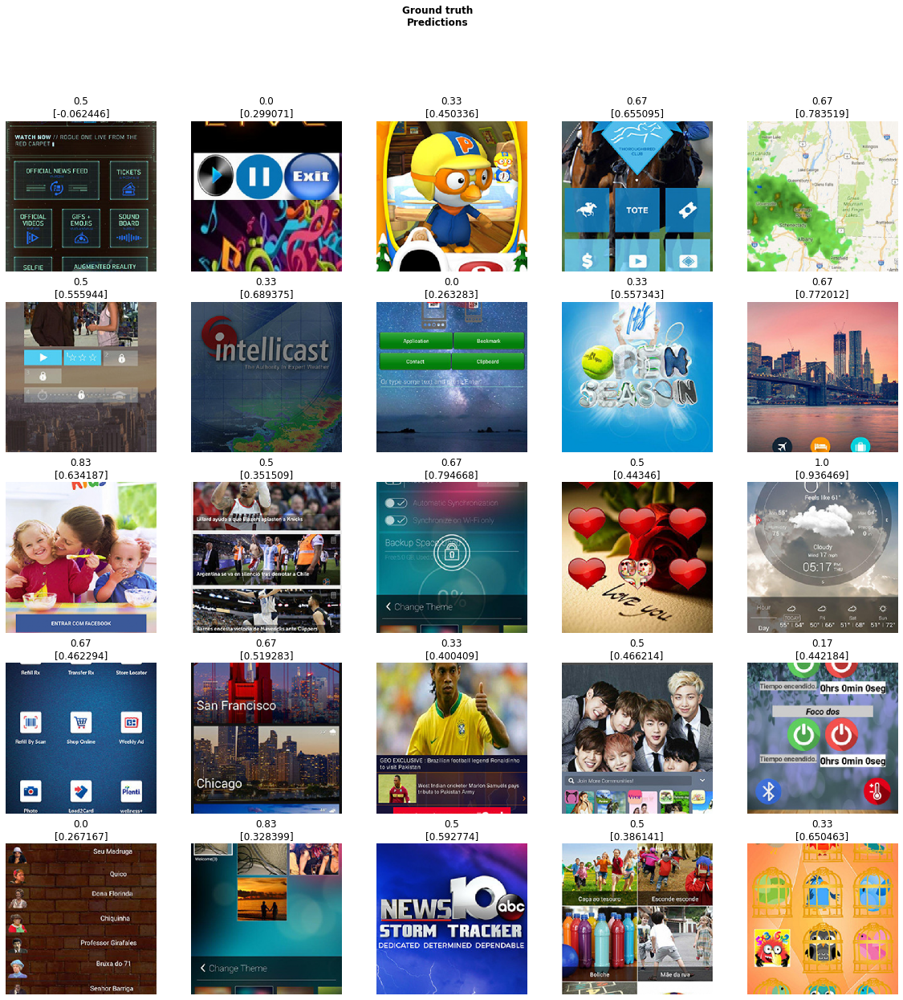

In [0]:
learn.show_results()

#### fit1cycle

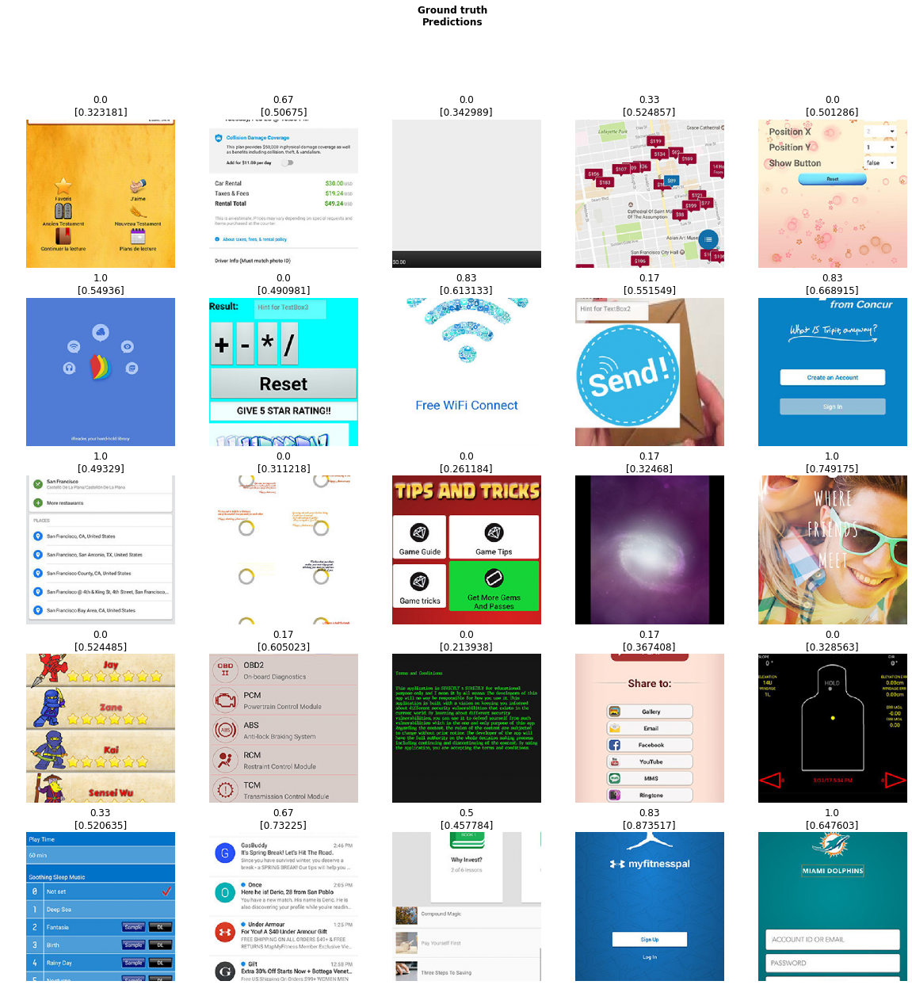

In [0]:
learn.show_results()

#Part 4 - Using more powerful networks...

## Training the ResNet50

Now we will train in the same way as in Part 2 but with one caveat: instead of using resnet34 as our backbone we will use resnet50 (resnet34 is a 34 layer residual network while resnet50 has 50 layers. It will be explained later in the course and you can learn the details in the [resnet paper](https://arxiv.org/pdf/1512.03385.pdf)).

Basically, resnet50 usually performs better because it is a deeper network with more parameters. Let's see if we can achieve a higher performance here. We reduce the batch size a bit since otherwise this larger network will require more GPU memory.

In [0]:
learn = cnn_learner(data, models.resnet50, metrics=mean_squared_error)
learn.loss = MSELossFlat

### First approach: *fit*

In [0]:
learn.fit(15, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model50-fit-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.776000,0.133441,0.133441,01:15
1,0.297462,0.097899,0.097899,01:11
2,0.159306,0.090451,0.090451,01:12
3,0.115024,0.097163,0.097163,01:11
4,0.100485,0.089916,0.089916,01:11
5,0.101297,0.116569,0.116569,01:12
6,0.097179,0.090967,0.090967,01:11
7,0.093670,0.089429,0.089429,01:11
8,0.091178,0.097367,0.097367,01:11
9,0.085425,0.088441,0.088441,01:11


### Second approach: *fit1cycle*

In [0]:
learn.fit_one_cycle(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model50-1cycle-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,3.799295,2.361221,2.361221,02:49
1,2.494662,0.551174,0.551174,02:33
2,0.957525,0.180907,0.180907,02:33
3,0.352201,0.121669,0.121669,02:33
4,0.175690,0.096412,0.096412,02:33
5,0.125969,0.096328,0.096328,02:33
6,0.109514,0.091204,0.091204,02:33
7,0.097650,0.086374,0.086374,02:33
8,0.086683,0.084489,0.084489,02:34
9,0.079830,0.080346,0.080346,02:33


...fine-tunings...

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.92E-06
Min loss divided by 10: 6.31E-08


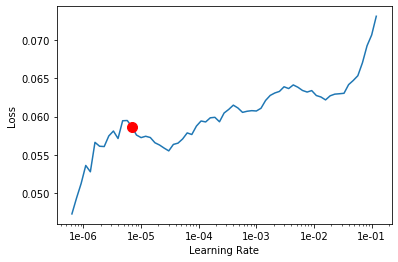

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model50-1cycle-best')
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model50-1cycle-best')
learn.unfreeze()
#max_lr=slice(6.3e-07, 7.6e-06)
learn.fit_one_cycle(10, max_lr=slice(5e-06, 3e-05))

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.061433,0.051646,0.051646,03:47
1,0.062318,0.053436,0.053436,03:27
2,0.059001,0.054889,0.054889,03:27
3,0.058349,0.062143,0.062143,03:27
4,0.050756,0.057591,0.057591,03:28
5,0.049408,0.058864,0.058864,03:27
6,0.044417,0.057466,0.057466,03:28
7,0.038738,0.056141,0.056141,03:28
8,0.034698,0.058321,0.058321,03:27
9,0.037380,0.056685,0.056685,03:28


## Results ResNet50

### fit

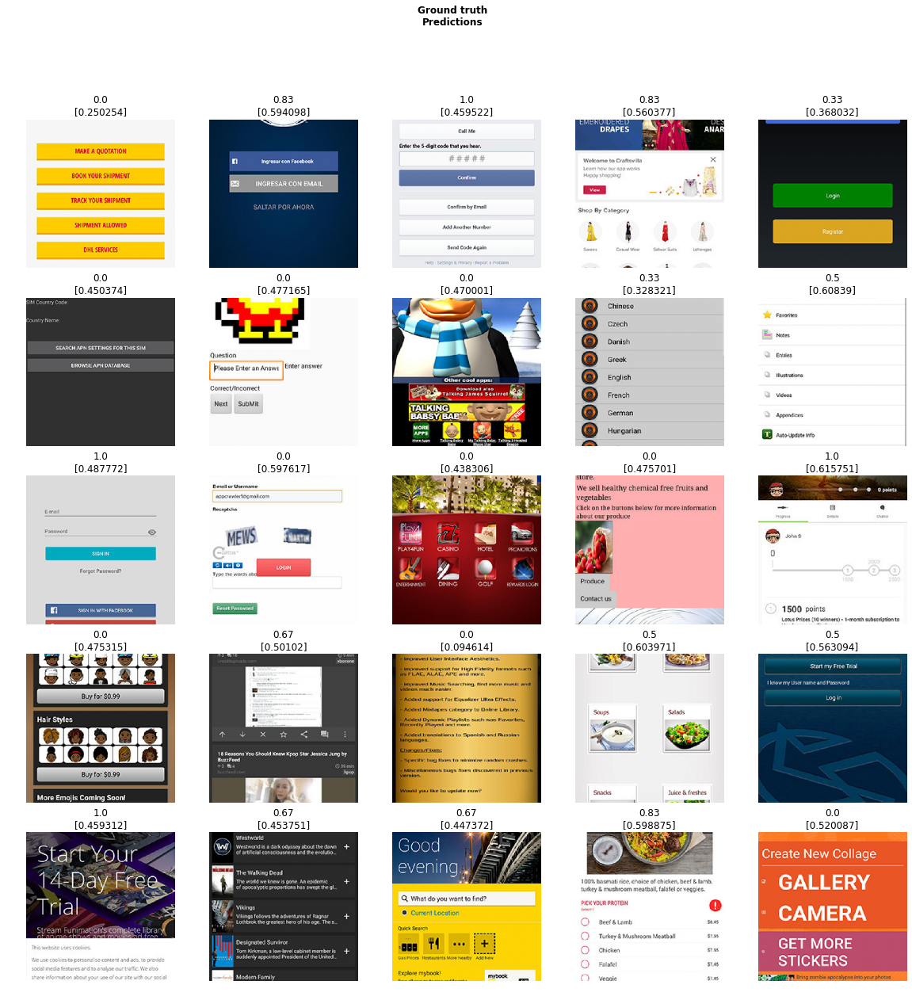

In [0]:
learn.show_results()

### fit1cycle

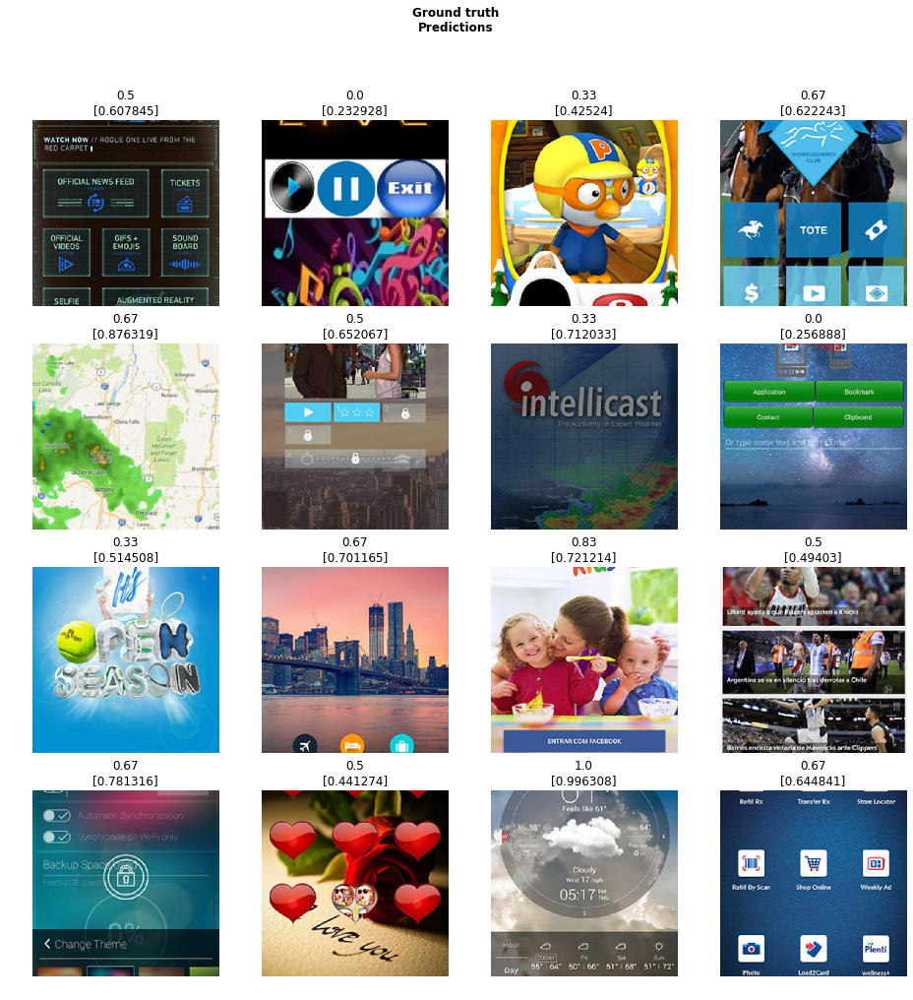

In [0]:
learn.show_results()

## Training ResNet101

In [0]:
learn = cnn_learner(data, models.resnet101, metrics=mean_squared_error)
learn.loss = MSELossFlat

### First approach: *fit*

In [0]:
learn.fit(15, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model101-fit-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.964141,0.195275,0.195275,04:29
1,0.241049,0.129049,0.129049,04:14
2,0.169532,0.108267,0.108267,04:14
3,0.177608,0.131872,0.131872,04:15
4,0.162020,0.149141,0.149141,04:14
5,0.160332,0.122738,0.122738,04:14
6,0.141220,0.123285,0.123285,04:14
7,0.131246,0.109461,0.109461,04:15
8,0.125797,0.098068,0.098068,04:14
9,0.123130,0.104120,0.104120,04:14


### Second approach: *fit1cycle*

In [0]:
learn.fit_one_cycle(10, callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model101-1cycle-best')])
# max_lr=slice(1.9e-06, 3e-06)

epoch,train_loss,valid_loss,mean_squared_error,time
0,1.332157,0.723593,0.723593,01:56
1,0.577611,0.177824,0.177824,01:52
2,0.191045,0.098625,0.098625,01:52
3,0.127879,0.094304,0.094304,01:51
4,0.114545,0.100369,0.100369,01:51
5,0.106391,0.085553,0.085553,01:51
6,0.097584,0.087404,0.087404,01:51
7,0.081880,0.081756,0.081756,01:51
8,0.075732,0.079825,0.079825,01:51
9,0.069905,0.077876,0.077876,01:51


...fine-tunings...

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model101-1cycle-best')

Learner(data=ImageDataBunch;

Train: LabelList (2188 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.67,0.17,0.67,0.17,0.33
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Valid: LabelList (480 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.33,0.33,1.0,0.17,0.67
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Test: LabelList (471 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: EmptyLabelList
,,,,
Path: /content/gdrive/My Drive/University/TCC/data_iter3, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, s

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.91E-06
Min loss divided by 10: 3.98E-05


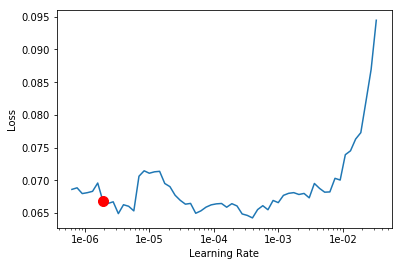

In [0]:
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model101-1cycle-best')
learn.unfreeze()
learn.fit_one_cycle(20, max_lr=slice(5e-07, 5e-06), callbacks=[SaveModelCallback(learn, every='epoch', monitor='mean_squared_error', name='model101-1cycle-2ndStage-best')])

epoch,train_loss,valid_loss,mean_squared_error,time
0,0.073170,0.079712,0.079712,02:33
1,0.068587,0.078031,0.078031,02:30
2,0.071371,0.077333,0.077333,02:30
3,0.071356,0.076289,0.076289,02:30
4,0.070999,0.077252,0.077252,02:30
5,0.070454,0.076333,0.076333,02:30
6,0.066739,0.076788,0.076788,02:30
7,0.064794,0.077555,0.077555,02:30
8,0.063018,0.078529,0.078529,02:30
9,0.065229,0.075475,0.075475,02:30


## Results ResNet101

### fit

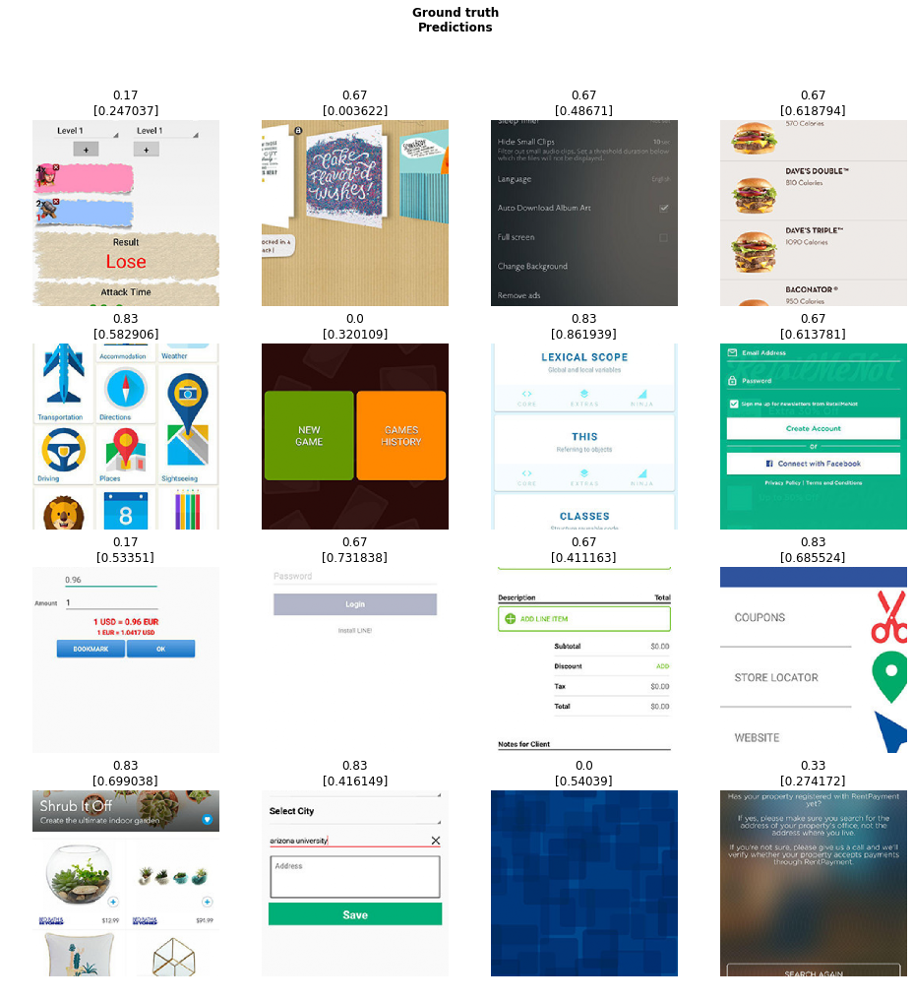

In [0]:
learn.show_results()

### fit1cycle

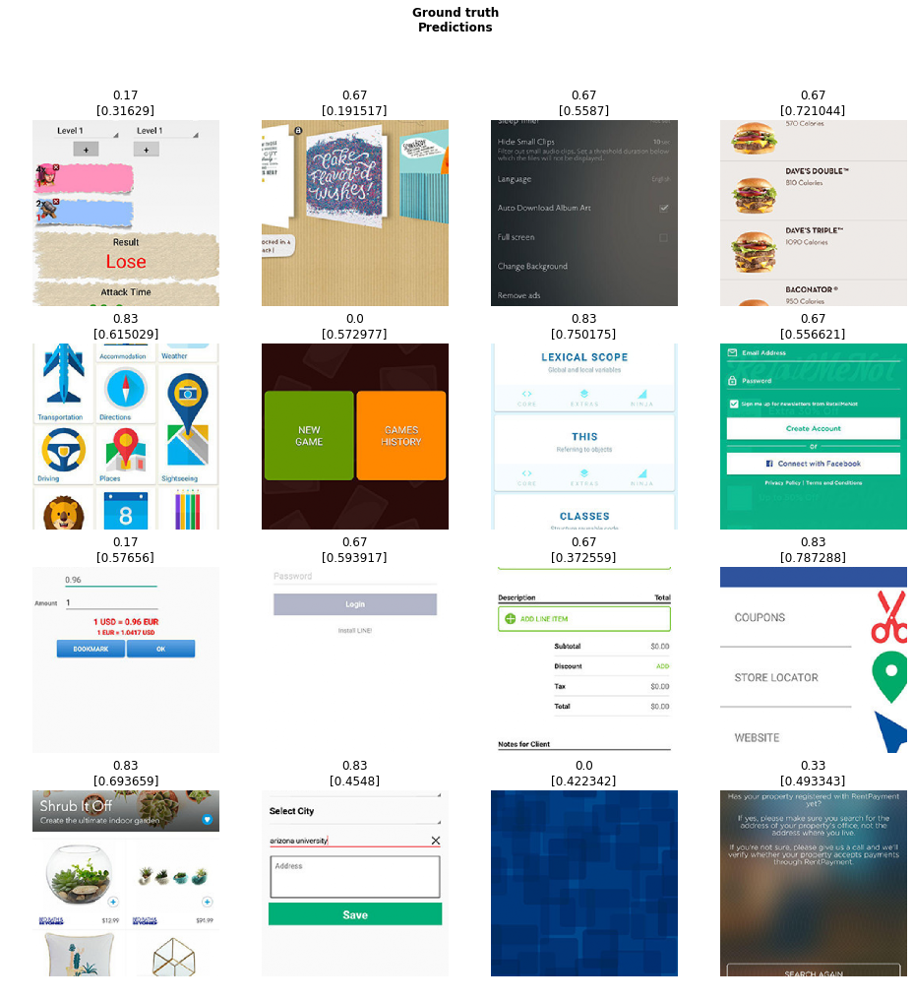

In [0]:
learn.show_results()

# Part 5 - Saved models reference

This section documents the best achieved results with each one of the models following both approaches.

**model18-fit-best**:
*   Trained with fit(10)
*   MSE of 0.078778
*   No fine-tuning made

**model18-1cycle-best**:
*   Trained with fit_one_cycle(10)
*   MSE of 0.077254
*   No fine-tuning made

**model18-1cycle-2ndStage-best**:
*   Fine-tuned(unfrozen, max_lr=slice(6e-07, 1e-06))
*   Trained with fit_one_cycle(15)
*   **MSE of 0.075770**

---


**model34-fit-best**:
*   Trained with fit(10)
*   MSE of 0.078778
*   No fine-tuning made

**model34-1cycle-best**:
*   Trained with fit_one_cycle(15)
*   MSE of 0.076452
*   No fine-tuning made

**model34-1cycle-2ndStage-best**:
*   Fine-tuned(unfrozen, max_lr=slice(6.31e-07, 8e-07))
*   Trained with fit_one_cycle(15)
*   **MSE of 0.065101**


---

**model50-fit-best**:
*   Trained with fit(15)
*   MSE of 0.081291
*   No fine-tuning made

**model50-1cycle-best**:
*   Trained with fit_one_cycle(9)
*   MSE of 0.073359
*   No fine-tuning made

**model50-1cycle-2ndStage-best**:
*   Fine-tuned(unfrozen, max_lr=slice(1.2e-06,1.5e-06))
*   Trained with fit_one_cycle(5)
*   MSE of 0.051867

**model50-1cycle-2ndStage-best2**:
*   Fine-tuned(unfrozen, max_lr=slice(1.2e-06,1.5e-06))
*   Trained with fit_one_cycle(5)
*   **MSE of 0.051369**


---

**model101-fit-best**:
*   Trained with fit(14)
*   MSE of 0.082701
*   No fine-tuning made

**model101-1cycle-best**:
*   Trained with fit_one_cycle(13)
*   **MSE of 0.074314**
*   No fine-tuning made

**model101-1cycle-2ndStage-best**:
*   Fine-tuned(unfrozen, max_lr=slice(6.3e-07, 7.6e-06))
*   Trained with fit_one_cycle(3)
*   **MSE of 0.52089**

# Part 6 - Testing and misc.

Loading desired weights...

In [0]:
learn.load('/content/gdrive/My Drive/University/TCC/data_iter3/models/model50-1cycle-2ndStage-best2')

Learner(data=ImageDataBunch;

Train: LabelList (2509 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.17,0.0,0.0,0.0,0.0
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Valid: LabelList (630 items)
x: ImageList
Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448),Image (3, 448, 448)
y: FloatList
0.5,0.0,0.33,0.67,0.67
Path: /content/gdrive/My Drive/University/TCC/data_iter3;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-

### Exporting the model

In [0]:
learn.export()

## Exporting prediction values for statistical analysis

In [0]:
# Make all predictions
preds = []
for img in data.valid_ds:
  preds.append((learn.predict(img[0]), img[1]))

# Grab only (Prediction, GroundTruth)
new_preds=[]
for item in preds:
  new_preds.append((item[0][0], item[1]))

# Show results
new_preds

[(FloatItem [0.68563], FloatItem 0.5),
 (FloatItem [0.185188], FloatItem 0.0),
 (FloatItem [0.649939], FloatItem 0.33),
 (FloatItem [0.548687], FloatItem 0.67),
 (FloatItem [0.685102], FloatItem 0.67),
 (FloatItem [0.771463], FloatItem 0.5),
 (FloatItem [1.110847], FloatItem 0.33),
 (FloatItem [0.158229], FloatItem 0.0),
 (FloatItem [0.314671], FloatItem 0.33),
 (FloatItem [0.925179], FloatItem 0.67),
 (FloatItem [0.529541], FloatItem 0.83),
 (FloatItem [0.317425], FloatItem 0.5),
 (FloatItem [1.203182], FloatItem 0.67),
 (FloatItem [0.152387], FloatItem 0.5),
 (FloatItem [1.225577], FloatItem 1.0),
 (FloatItem [0.466657], FloatItem 0.67),
 (FloatItem [0.759364], FloatItem 0.67),
 (FloatItem [0.655596], FloatItem 0.33),
 (FloatItem [0.606488], FloatItem 0.5),
 (FloatItem [0.082221], FloatItem 0.17),
 (FloatItem [0.191951], FloatItem 0.0),
 (FloatItem [0.597248], FloatItem 0.83),
 (FloatItem [0.461079], FloatItem 0.5),
 (FloatItem [0.627543], FloatItem 0.5),
 (FloatItem [0.355495], Floa

In [0]:
# Exporting results in csv format
import csv
f = open('/content/gdrive/My Drive/University/TCC/data_iter3/bland_altman2.csv', 'w', newline='')
writer = csv.writer(f)
writer.writerow(['predicted', 'target'])

for item in new_preds:
  writer.writerow(item)